#Step 1: Import the necessary libraries:

In [ ]:
import pandas as pd
import numpy as np

import seaborn as sns
from google.colab import drive
drive.mount('/content/drive')

import pandas as pd
from sklearn.preprocessing import OneHotEncoder
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score, cross_val_predict
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report, roc_curve, auc
from sklearn.metrics import precision_score, recall_score, f1_score, precision_recall_curve, f1_score
import matplotlib.pyplot as plt


Mounted at /content/drive


#Step 2: Load the dataset from a CSV file:

In [ ]:
data = pd.read_csv('/content/drive/MyDrive/pip-datasets/WSSVRiskFactor_rev.csv')
data.head(50)

,SlNo,FarmerAge,FarmerEduaction,InvolveWithShrimpFarming,Latitude,Longitude,Zone,PriorLandUse,Area_ha,SoilType,...,FootBath,LimitedAccess,SameEquipmentForWholeCultureArea,CulturePractice,Temperature,pH,Salinity,PreviousPrevalence(%),CurrentPrevalance(%),VirusDetected
0,1,50,Primary,18,22.801215,89.550397,Khulna,3,0.18,1,...,0,0,1,2,28.0,8.0,9.0,70,0,0
1,2,64,Junior Secondary,20,22.840350,89.752238,Khulna,3,0.15,2,...,0,0,1,2,NaN,NaN,NaN,20,0,0
2,3,25,Junior Secondary,18,22.823490,89.672769,Khulna,3,0.81,2,...,0,0,1,2,NaN,NaN,NaN,75,15,1
3,4,37,Secondary,18,22.823569,89.672605,Khulna,3,0.40,2,...,0,0,1,2,NaN,NaN,2.0,15,20,1
4,5,22,Primary,4,22.597399,89.739075,Bagerhat,3,2.32,2,...,0,0,1,2,24.0,7.5,11.0,15,45,1
5,6,30,Secondary,9,22.595857,89.736327,Bagerhat,3,0.40,2,...,0,0,1,2,NaN,11.0,7.0,65,40,1
6,7,25,Higher Secondary,10,22.597468,89.739096,Bagerhat,3,0.61,2,...,0,0,1,2,26.0,7.0,10.0,20,35,1
7,8,28,Primary,10,22.598216,89.729599,Khulna,3,2.02,2,...,0,0,1,2,26.0,7.5,9.0,70,35,1
8,9,50,Primary,16,22.596792,89.735502,Bagerhat,3,4.05,2,...,0,0,1,2,25.0,7.0,8.0,30,65,1
9,10,50,Primary,10,22.596792,89.735502,Bagerhat,3,4.05,2,...,0,0,1,2,25.0,8.0,7.0,40,100,1


In [ ]:
import pandas as pd

file_path = '/content/drive/MyDrive/pip-datasets/WSSVRiskFactor_rev.csv'
data = pd.read_csv(file_path)

column_to_delete = ['FarmerEduaction','Latitude', 'Longitude']
data = data.drop(column_to_delete, axis=1)

output_file_path = '/content/drive/MyDrive/pip-datasets/WSSVRiskFactor_rev1.csv'
data.to_csv(output_file_path, index=False)


In [ ]:
data = pd.read_csv('/content/drive/MyDrive/pip-datasets/WSSVRiskFactor_rev1.csv')
data.head(50)

,SlNo,FarmerAge,InvolveWithShrimpFarming,Zone,PriorLandUse,Area_ha,SoilType,CanalDepth_ft,GherDepth_ft,Operator,...,FootBath,LimitedAccess,SameEquipmentForWholeCultureArea,CulturePractice,Temperature,pH,Salinity,PreviousPrevalence(%),CurrentPrevalance(%),VirusDetected
0,1,50,18,Khulna,3,0.18,1,7.0,5.0,1,...,0,0,1,2,28.0,8.0,9.0,70,0,0
1,2,64,20,Khulna,3,0.15,2,7.0,3.0,1,...,0,0,1,2,NaN,NaN,NaN,20,0,0
2,3,25,18,Khulna,3,0.81,2,6.0,4.0,1,...,0,0,1,2,NaN,NaN,NaN,75,15,1
3,4,37,18,Khulna,3,0.40,2,6.0,4.0,1,...,0,0,1,2,NaN,NaN,2.0,15,20,1
4,5,22,4,Bagerhat,3,2.32,2,6.0,2.5,1,...,0,0,1,2,24.0,7.5,11.0,15,45,1
5,6,30,9,Bagerhat,3,0.40,2,8.0,2.0,1,...,0,0,1,2,NaN,11.0,7.0,65,40,1
6,7,25,10,Bagerhat,3,0.61,2,8.0,3.0,1,...,0,0,1,2,26.0,7.0,10.0,20,35,1
7,8,28,10,Khulna,3,2.02,2,5.0,2.0,0,...,0,0,1,2,26.0,7.5,9.0,70,35,1
8,9,50,16,Bagerhat,3,4.05,2,6.0,3.0,1,...,0,0,1,2,25.0,7.0,8.0,30,65,1
9,10,50,10,Bagerhat,3,4.05,2,4.0,3.0,1,...,0,0,1,2,25.0,8.0,7.0,40,100,1


In [ ]:
# Handle null values
numerical_columns = data.select_dtypes(include=['float64']).columns
data[numerical_columns] = data[numerical_columns].fillna(data[numerical_columns].mean())

categorical_columns = data.select_dtypes(include=['object']).columns
data[categorical_columns] = data[categorical_columns].fillna(data[categorical_columns].mode().iloc[0])

data.head(50)

,SlNo,FarmerAge,InvolveWithShrimpFarming,Zone,PriorLandUse,Area_ha,SoilType,CanalDepth_ft,GherDepth_ft,Operator,...,FootBath,LimitedAccess,SameEquipmentForWholeCultureArea,CulturePractice,Temperature,pH,Salinity,PreviousPrevalence(%),CurrentPrevalance(%),VirusDetected
0,1,50,18,Khulna,3,0.18,1,7.0,5.0,1,...,0,0,1,2,28.00000,8.000000,9.000000,70,0,0
1,2,64,20,Khulna,3,0.15,2,7.0,3.0,1,...,0,0,1,2,29.70122,7.723214,11.303012,20,0,0
2,3,25,18,Khulna,3,0.81,2,6.0,4.0,1,...,0,0,1,2,29.70122,7.723214,11.303012,75,15,1
3,4,37,18,Khulna,3,0.40,2,6.0,4.0,1,...,0,0,1,2,29.70122,7.723214,2.000000,15,20,1
4,5,22,4,Bagerhat,3,2.32,2,6.0,2.5,1,...,0,0,1,2,24.00000,7.500000,11.000000,15,45,1
5,6,30,9,Bagerhat,3,0.40,2,8.0,2.0,1,...,0,0,1,2,29.70122,11.000000,7.000000,65,40,1
6,7,25,10,Bagerhat,3,0.61,2,8.0,3.0,1,...,0,0,1,2,26.00000,7.000000,10.000000,20,35,1
7,8,28,10,Khulna,3,2.02,2,5.0,2.0,0,...,0,0,1,2,26.00000,7.500000,9.000000,70,35,1
8,9,50,16,Bagerhat,3,4.05,2,6.0,3.0,1,...,0,0,1,2,25.00000,7.000000,8.000000,30,65,1
9,10,50,10,Bagerhat,3,4.05,2,4.0,3.0,1,...,0,0,1,2,25.00000,8.000000,7.000000,40,100,1


In [ ]:

# Split features and target
X = data.drop('VirusDetected', axis=1)
y = data['VirusDetected']

# List of categorical columns
categorical_cols = ['Zone']

# Initialize OneHotEncoder
encoder = OneHotEncoder(sparse=False, drop='first')  # 'drop' removes one level to avoid multicollinearity

# Encode categorical columns and concatenate with remaining numerical columns
X_encoded = encoder.fit_transform(X[categorical_cols])
encoded_cols = encoder.get_feature_names_out(categorical_cols)
X_encoded = pd.DataFrame(X_encoded, columns=encoded_cols, index=X.index)

# Concatenate encoded categorical columns with the remaining numerical columns
X_final = pd.concat([X.drop(categorical_cols, axis=1), X_encoded], axis=1)

# Display the encoded dataset
print(X_final)
print(y)


     SlNo  FarmerAge  InvolveWithShrimpFarming  PriorLandUse  Area_ha  \
0       1         50                        18             3     0.18   
1       2         64                        20             3     0.15   
2       3         25                        18             3     0.81   
3       4         37                        18             3     0.40   
4       5         22                         4             3     2.32   
..    ...        ...                       ...           ...      ...   
228   229         53                         1             1     2.83   
229   230         40                         5             1     0.87   
230   231         30                        12             3     0.20   
231   232         36                         2             1    40.49   
232   233         22                        10             3     0.81   

     SoilType  CanalDepth_ft  GherDepth_ft  Operator  FertilizerUse  ...  \
0           1            7.0           5.0     

/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_encoders.py:868: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(


#Step 4: Exploratory Data Analysis (EDA) and Visualization

Data Summary:
   SlNo  FarmerAge  InvolveWithShrimpFarming      Zone  PriorLandUse  Area_ha  \
0     1         50                        18    Khulna             3     0.18   
1     2         64                        20    Khulna             3     0.15   
2     3         25                        18    Khulna             3     0.81   
3     4         37                        18    Khulna             3     0.40   
4     5         22                         4  Bagerhat             3     2.32   

   SoilType  CanalDepth_ft  GherDepth_ft  Operator  ...  FootBath  \
0         1            7.0           5.0         1  ...         0   
1         2            7.0           3.0         1  ...         0   
2         2            6.0           4.0         1  ...         0   
3         2            6.0           4.0         1  ...         0   
4         2            6.0           2.5         1  ...         0   

   LimitedAccess  SameEquipmentForWholeCultureArea  CulturePractice  \
0            

<ipython-input-9-1443031ff5a4>:15: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corr = data.corr()


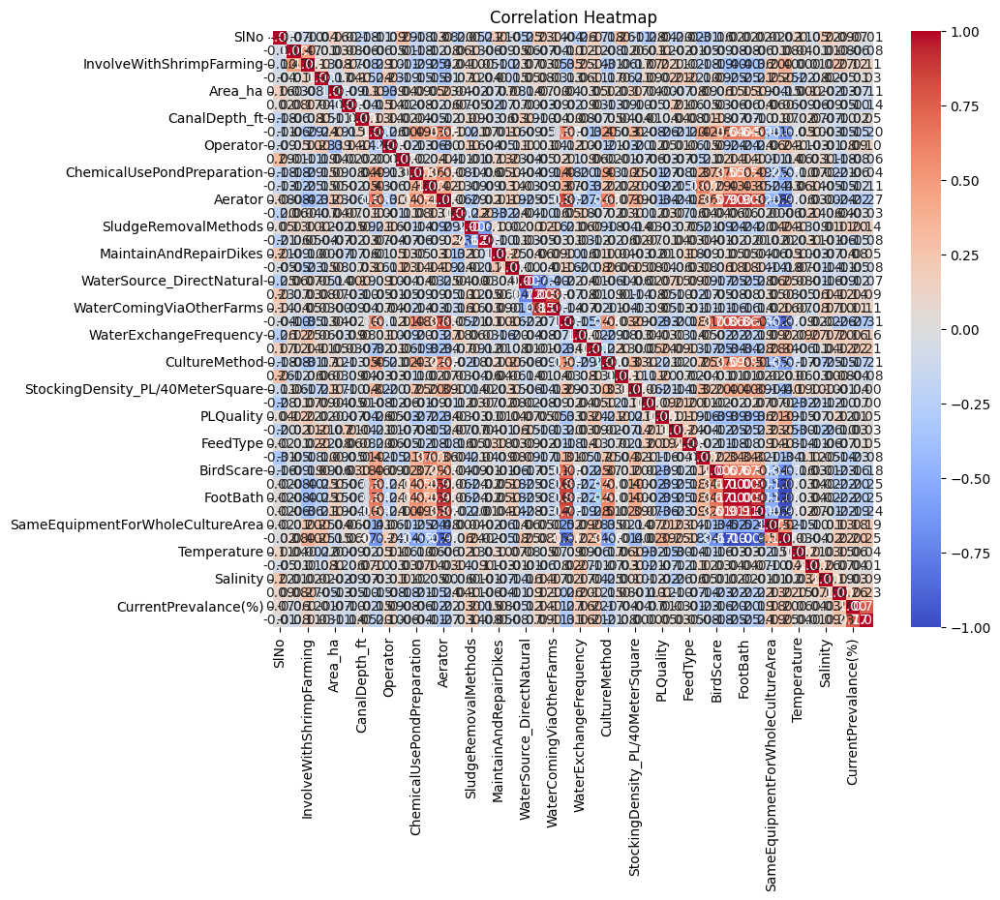

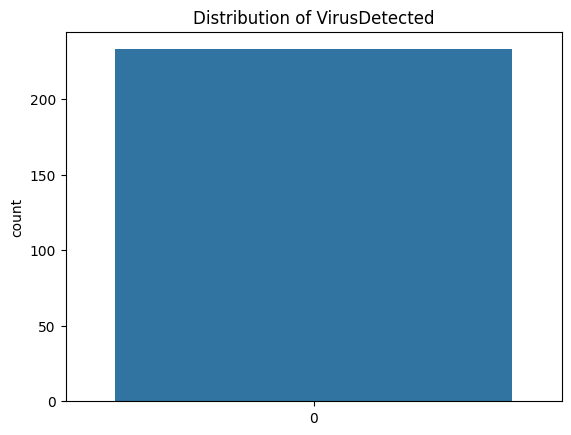

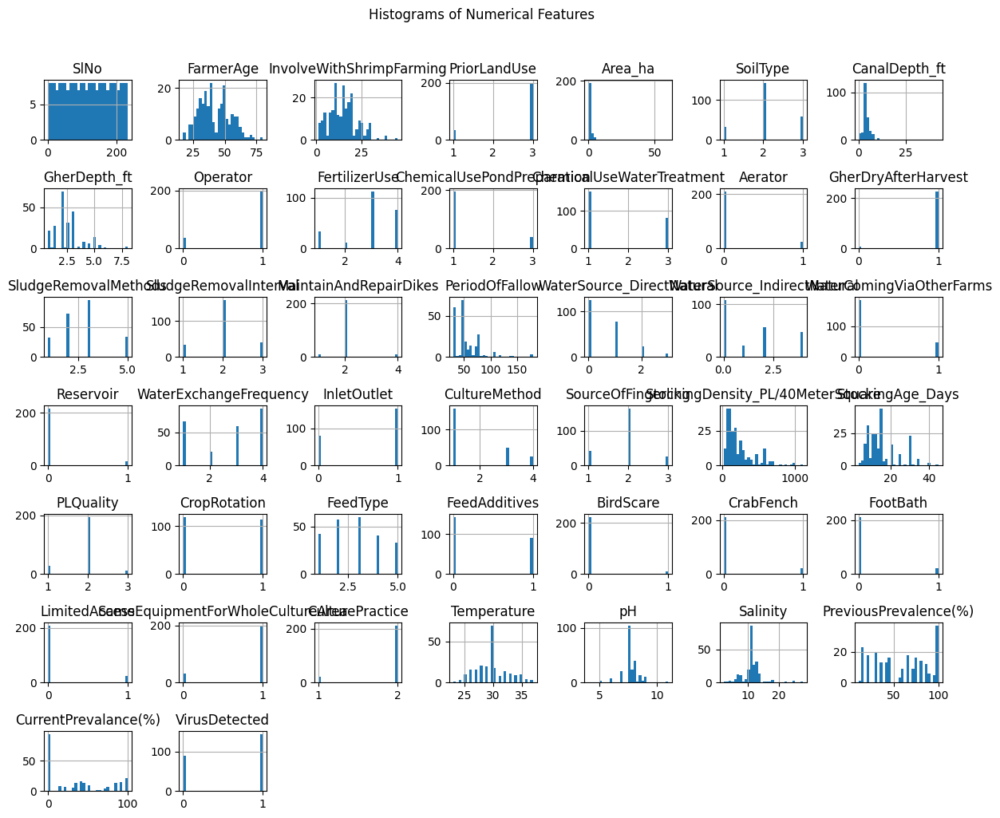

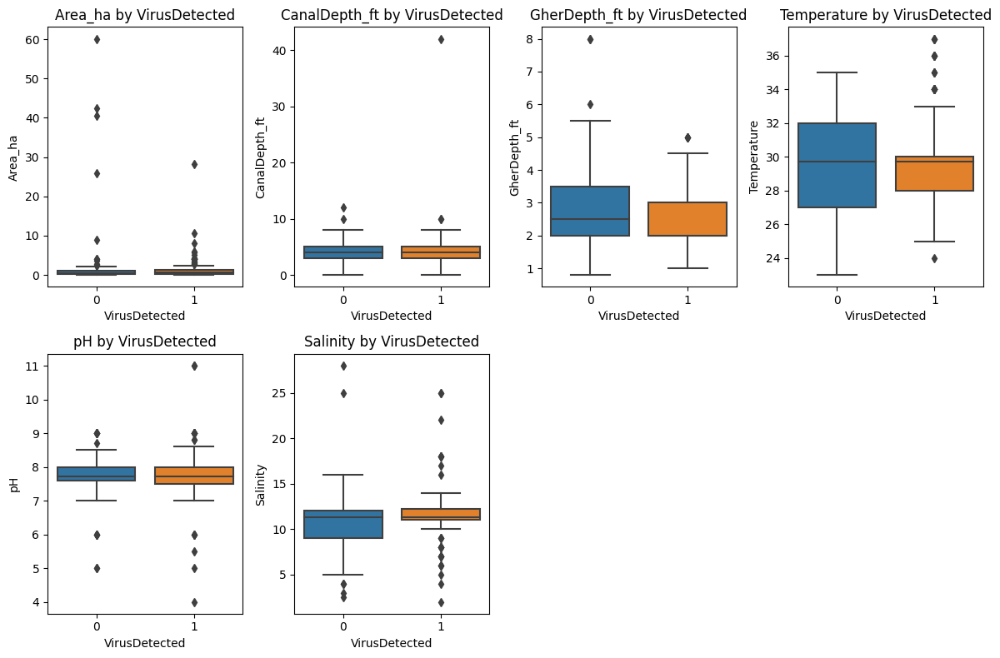

In [ ]:

# Data Summary
print("Data Summary:")
print(data.head())
print("\nData Info:")
print(data.info())
print("\nData Statistics:")
print(data.describe())

# Data Visualization and EDA
# Pairplot for visualizing relationships between features
sns.pairplot(data, hue='VirusDetected', diag_kind='kde')
plt.show()

# Correlation Heatmap
corr = data.corr()
plt.figure(figsize=(10, 8))
sns.heatmap(corr, annot=True, cmap='coolwarm', fmt='.2f')
plt.title('Correlation Heatmap')
plt.show()

# Distribution of the target variable 'VirusDetected'
sns.countplot(data['VirusDetected'])
plt.title('Distribution of VirusDetected')
plt.show()

# Histograms of numerical features
data.hist(figsize=(12, 10), bins=30)
plt.suptitle("Histograms of Numerical Features", y=1.02)
plt.tight_layout()
plt.show()

# Boxplots for numerical features by VirusDetected
numerical_features = data.select_dtypes(include=['float64']).columns
num_features_count = len(numerical_features)
num_subplots = min(num_features_count, 8)  # Adjusted to ensure maximum 8 subplots

plt.figure(figsize=(12, 8))
for i, feature in enumerate(numerical_features, 1):
    plt.subplot(2, 4, i)
    sns.boxplot(x='VirusDetected', y=feature, data=data)
    plt.title(f'{feature} by VirusDetected')
    if i == num_subplots:  # Break loop after 8 subplots
        break

plt.tight_layout()
plt.show()


#Step 5: Train and test data split

In [ ]:
# Split the data into train, test, and validation sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.2, random_state=42)

# Model Training

In [ ]:
# List of categorical columns
categorical_cols = ['Zone']  # Replace with your categorical column names

# Initialize OneHotEncoder
encoder = OneHotEncoder(sparse=False, drop='first')  # 'drop' removes one level to avoid multicollinearity

# Encode categorical columns and concatenate with remaining numerical columns
X_encoded = encoder.fit_transform(X[categorical_cols])
encoded_cols = encoder.get_feature_names_out(categorical_cols)
X_encoded = pd.DataFrame(X_encoded, columns=encoded_cols, index=X.index)

# Concatenate encoded categorical columns with the remaining numerical columns
X_final = pd.concat([X.drop(categorical_cols, axis=1), X_encoded], axis=1)

# Split your data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X_final, y, test_size=0.2, random_state=42)

# Initialize the random forest classifier
rf_classifier = RandomForestClassifier()

# Train the model
rf_classifier.fit(X_train, y_train)


/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_encoders.py:868: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(


RandomForestClassifier()

#Step 6: Feature Importance Calculation

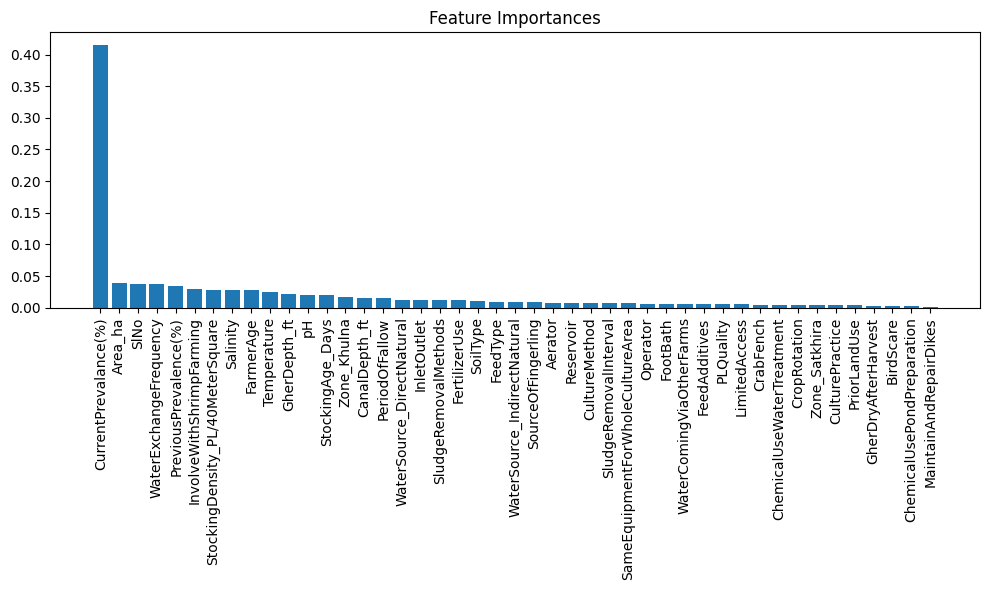

In [ ]:
# Calculate feature importance
importances = rf_classifier.feature_importances_
feature_names = X_train.columns  # Use the columns from X_train

# Sort feature importances in descending order
indices = importances.argsort()[::-1]

# Plot feature importances
plt.figure(figsize=(10, 6))
plt.title("Feature Importances")
plt.bar(range(X_train.shape[1]), importances[indices], align="center")
plt.xticks(range(X_train.shape[1]), feature_names[indices], rotation=90)
plt.tight_layout()
plt.show()


#Step 7: Model training with cross validation

Cross-Validation Scores: [1.         1.         0.95744681 1.         0.93478261]
Mean Cross-Validation Score: 0.978445883441258


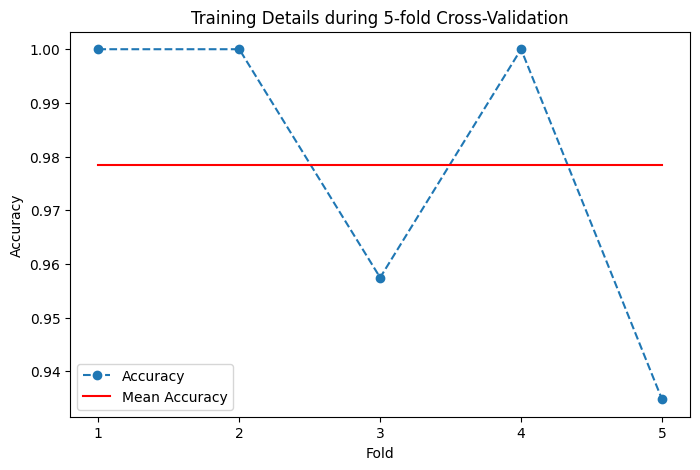

In [ ]:
# Model training with 5-fold cross-validation
cv_scores = cross_val_score(rf_classifier, X_final, y, cv=5, scoring='accuracy')
cv_predictions = cross_val_predict(rf_classifier, X_final, y, cv=5)

# Calculate mean cross-validation score
mean_cv_score = np.mean(cv_scores)

print("Cross-Validation Scores:", cv_scores)
print("Mean Cross-Validation Score:", mean_cv_score)

# Plot training details
plt.figure(figsize=(8, 5))
plt.plot(range(1, 6), cv_scores, marker='o', linestyle='--', label='Accuracy')
plt.plot(range(1, 6), [mean_cv_score] * 5, color='r', linestyle='-', label='Mean Accuracy')
plt.xticks(range(1, 6))
plt.xlabel('Fold')
plt.ylabel('Accuracy')
plt.title('Training Details during 5-fold Cross-Validation')
plt.legend()
plt.show()




#Step 8: Model testing and evaluation

Accuracy: 0.9787234042553191
Precision: 1.0
Recall: 0.96875
F1-score: 0.9841269841269841
Classification Report:
              precision    recall  f1-score   support

           0       0.94      1.00      0.97        15
           1       1.00      0.97      0.98        32

    accuracy                           0.98        47
   macro avg       0.97      0.98      0.98        47
weighted avg       0.98      0.98      0.98        47



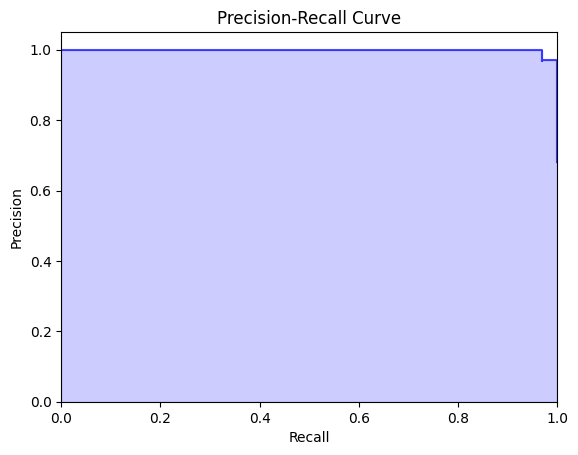

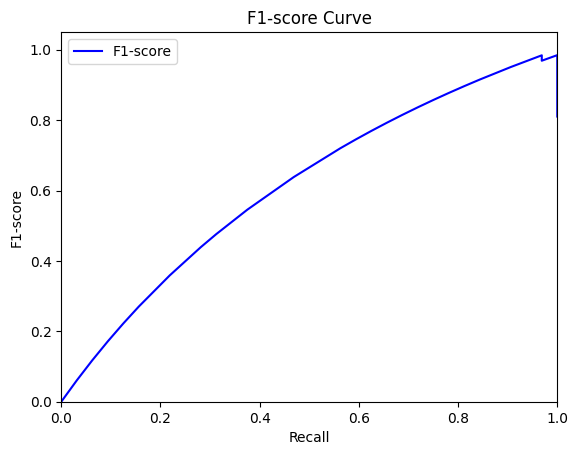

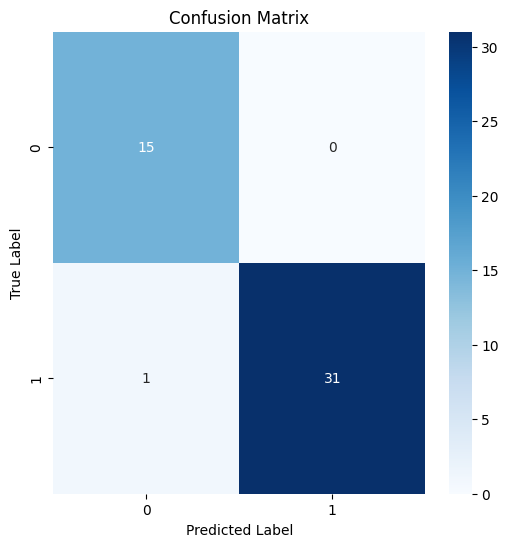

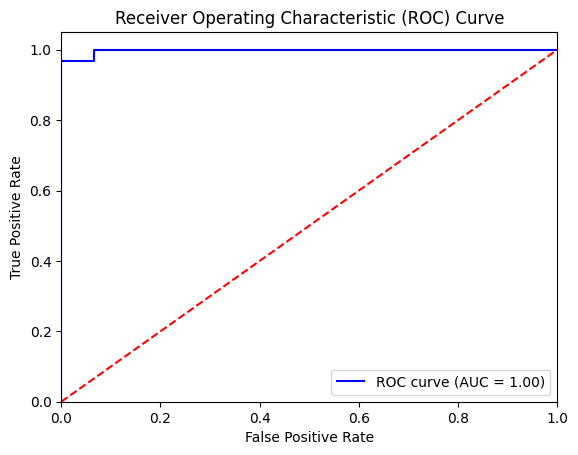

In [ ]:
# Model testing and evaluation
y_pred = rf_classifier.predict(X_test)

# Calculate accuracy, precision, recall, and F1-score
accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred)

print("Accuracy:", accuracy)
print("Precision:", precision)
print("Recall:", recall)
print("F1-score:", f1)

# Generate and print classification report
class_report = classification_report(y_test, y_pred)
print("Classification Report:")
print(class_report)



# Plot Precision-Recall curve
y_pred_probs = rf_classifier.predict_proba(X_test)[:, 1]
precision, recall, _ = precision_recall_curve(y_test, y_pred_probs)

plt.step(recall, precision, color='b', alpha=0.7, where='post')
plt.fill_between(recall, precision, step='post', alpha=0.2, color='b')
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curve')
plt.ylim([0.0, 1.05])
plt.xlim([0.0, 1.0])
plt.show()

# Plot F1-score curve
f1_values = 2 * (precision * recall) / (precision + recall)
plt.plot(recall, f1_values, color='b', label='F1-score')
plt.xlabel('Recall')
plt.ylabel('F1-score')
plt.title('F1-score Curve')
plt.ylim([0.0, 1.05])
plt.xlim([0.0, 1.0])
plt.legend()
plt.show()


# Plot Confusion matrix
confusion_mat = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(6, 6))
sns.heatmap(confusion_mat, annot=True, fmt='d', cmap='Blues')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.title('Confusion Matrix')
plt.show()


# Calculate ROC curve and AUC
y_pred_probs = rf_classifier.predict_proba(X_test)[:, 1]
fpr, tpr, thresholds = roc_curve(y_test, y_pred_probs)
roc_auc = auc(fpr, tpr)

# Plot ROC curve
plt.plot(fpr, tpr, color='b', label='ROC curve (AUC = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='r', linestyle='--')
plt.xlim([0, 1])
plt.ylim([0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()


# Train test graphs

/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_encoders.py:868: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(


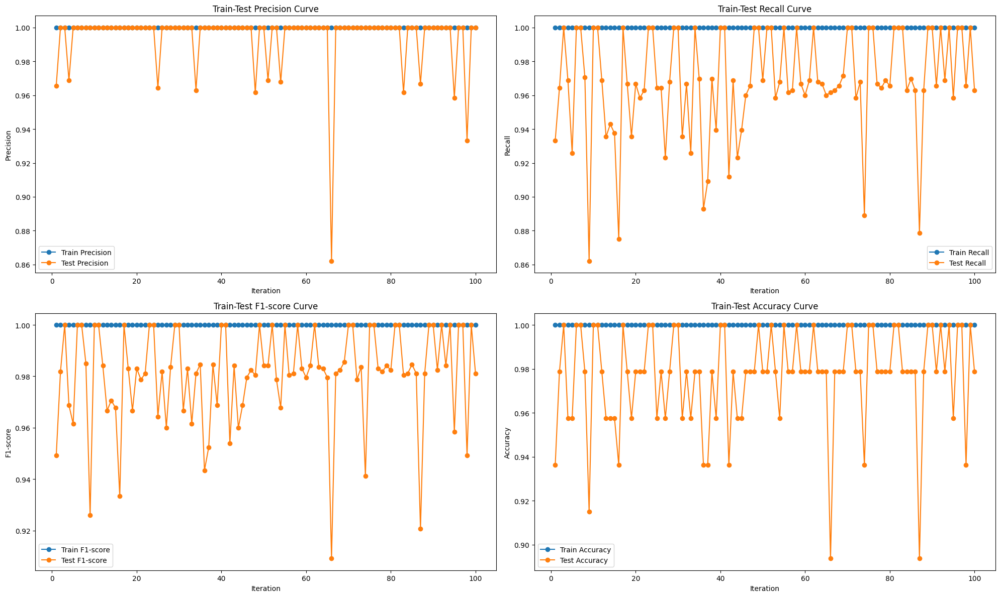

In [ ]:

from sklearn.metrics import precision_score, recall_score, f1_score, accuracy_score



# List of categorical columns
categorical_cols = ['Zone']  # Replace with your categorical column names

# Initialize OneHotEncoder
encoder = OneHotEncoder(sparse=False, drop='first')  # 'drop' removes one level to avoid multicollinearity

# Encode categorical columns and concatenate with remaining numerical columns
X_encoded = encoder.fit_transform(X[categorical_cols])
encoded_cols = encoder.get_feature_names_out(categorical_cols)
X_encoded = pd.DataFrame(X_encoded, columns=encoded_cols, index=X.index)

# Concatenate encoded categorical columns with the remaining numerical columns
X_final = pd.concat([X.drop(categorical_cols, axis=1), X_encoded], axis=1)

# Initialize lists to store train and test scores for each iteration
train_precision, test_precision = [], []
train_recall, test_recall = [], []
train_f1, test_f1 = [], []
train_accuracy, test_accuracy = [], []

# Number of iterations for train-test splits
num_iterations = 100

for i in range(num_iterations):
    # Split the data into train and test sets
    X_train, X_test, y_train, y_test = train_test_split(X_final, y, test_size=0.2, random_state=i)

    # Step 3: Model training
    rf_classifier = RandomForestClassifier()
    rf_classifier.fit(X_train, y_train)

    # Step 4: Model evaluation on train and test sets
    y_train_pred = rf_classifier.predict(X_train)
    y_test_pred = rf_classifier.predict(X_test)

    # Calculate precision, recall, F1-score, and accuracy for train and test sets
    train_precision.append(precision_score(y_train, y_train_pred))
    test_precision.append(precision_score(y_test, y_test_pred))

    train_recall.append(recall_score(y_train, y_train_pred))
    test_recall.append(recall_score(y_test, y_test_pred))

    train_f1.append(f1_score(y_train, y_train_pred))
    test_f1.append(f1_score(y_test, y_test_pred))

    train_accuracy.append(accuracy_score(y_train, y_train_pred))
    test_accuracy.append(accuracy_score(y_test, y_test_pred))

# Step 5: Plot train-test curves
iterations = np.arange(1, num_iterations + 1)

plt.figure(figsize=(20, 12))

# Precision curve
plt.subplot(2, 2, 1)
plt.plot(iterations, train_precision, marker='o', label='Train Precision')
plt.plot(iterations, test_precision, marker='o', label='Test Precision')
plt.xlabel('Iteration')
plt.ylabel('Precision')
plt.title('Train-Test Precision Curve')
plt.legend()

# Recall curve
plt.subplot(2, 2, 2)
plt.plot(iterations, train_recall, marker='o', label='Train Recall')
plt.plot(iterations, test_recall, marker='o', label='Test Recall')
plt.xlabel('Iteration')
plt.ylabel('Recall')
plt.title('Train-Test Recall Curve')
plt.legend()

# F1-score curve
plt.subplot(2, 2, 3)
plt.plot(iterations, train_f1, marker='o', label='Train F1-score')
plt.plot(iterations, test_f1, marker='o', label='Test F1-score')
plt.xlabel('Iteration')
plt.ylabel('F1-score')
plt.title('Train-Test F1-score Curve')
plt.legend()

# Accuracy curve
plt.subplot(2, 2, 4)
plt.plot(iterations, train_accuracy, marker='o', label='Train Accuracy')
plt.plot(iterations, test_accuracy, marker='o', label='Test Accuracy')
plt.xlabel('Iteration')
plt.ylabel('Accuracy')
plt.title('Train-Test Accuracy Curve')
plt.legend()

plt.tight_layout()
plt.show()
